**Анализ рынка заведенйи общепита Москвы**

 В этом проекте мне необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места инвесторам из фонда «Shut Up and Take My Money».

**Описание данных**

<p>name — название заведения;</p>
<p>address — адрес заведения;</p>
<p>category — категория заведения, например «кафе», «пиццерия» или «кофейня»;</p>
<p>hours — информация о днях и часах работы;</p>
<p>lat — широта географической точки, в которой находится заведение;</p>
<p>lng — долгота географической точки, в которой находится заведение;</p>
<p>rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);</p>
<p>price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;</p>
<p>avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона</p>
<p>middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:</p>
<p>middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»</p>
<p>chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки)</p>
<p>district — административный район, в котором находится заведение, например Центральный административный округ;</p>
<p>seats — количество посадочных мест.</p>


#### Загрузка и знакомство

In [1]:
# загрузка библиотек
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
import json
from folium import Map, Marker, Figure
from folium.plugins import MarkerCluster
from folium import Map, Choropleth
import folium
from folium.plugins import MarkerCluster
from datetime import datetime

In [2]:
# загрузка данных из файла
import os

path = '/datasets/moscow_places.csv'

if os.path.exists(path):
    places = pd.read_csv(path)
    print('Файл загружен')
else:
    print('Не удалось загрузить файл')

Файл загружен


In [3]:
display(places.head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Названия правильные, типы данных тоже. Всего 8406 заведений. 

In [5]:
# Подсчет и вывод уникальных значений для каждого столбца
for column in places.columns:
    unique_count = places[column].nunique()
    print(f"Количество уникальных значений в столбце {column}: {unique_count}")

Количество уникальных значений в столбце name: 5614
Количество уникальных значений в столбце category: 8
Количество уникальных значений в столбце address: 5753
Количество уникальных значений в столбце district: 9
Количество уникальных значений в столбце hours: 1307
Количество уникальных значений в столбце lat: 8209
Количество уникальных значений в столбце lng: 8258
Количество уникальных значений в столбце rating: 41
Количество уникальных значений в столбце price: 4
Количество уникальных значений в столбце avg_bill: 897
Количество уникальных значений в столбце middle_avg_bill: 230
Количество уникальных значений в столбце middle_coffee_cup: 96
Количество уникальных значений в столбце chain: 2
Количество уникальных значений в столбце seats: 229


In [6]:
# вывести уникальные значения из столбца категории
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Всего 5 614 названий заведений (вероятно некоторые сетевые из 8 406 заведений) из 8 категории.

Названия категорий логичные, менять не будем.

**Подвывод:** Всего у нас 8406 строк, менять типы данных и названия не требуется. 

#### Предобработка

Посмотрим дубликаты

In [7]:
places.duplicated().sum()

0

Полных дубликатов нет, посмотрим по отдельным столбцам

In [8]:
for c in places.columns:
    duplicates = places[c].duplicated().sum()
    print(f'Количество дубликатов в столбце {c}: {duplicates}')

Количество дубликатов в столбце name: 2792
Количество дубликатов в столбце category: 8398
Количество дубликатов в столбце address: 2653
Количество дубликатов в столбце district: 8397
Количество дубликатов в столбце hours: 7098
Количество дубликатов в столбце lat: 197
Количество дубликатов в столбце lng: 148
Количество дубликатов в столбце rating: 8365
Количество дубликатов в столбце price: 8401
Количество дубликатов в столбце avg_bill: 7508
Количество дубликатов в столбце middle_avg_bill: 8175
Количество дубликатов в столбце middle_coffee_cup: 8309
Количество дубликатов в столбце chain: 8404
Количество дубликатов в столбце seats: 8176


Пропуски в названи заведения (name) 2792 может означать, что некоторые названия заведений повторяются, но если это сетевые то не страшно. Пропуски в category, hours, district, rating, price, avg_bill, middle_avg_bill, middle_coffee_cup, chain и seats. Все эти показатели могут логично повторяться для разных заведений.

In [9]:
# подсчет пустых значений
places.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Есть пропуски данных в часах работы (hours) - 536 пропусков, категории цен(price) - 5091, что очень много и печально, в среднем чеке (avg_bill) - 5257, что тоже огорчает, оценкой среднего чека (middle_avg_bill), оценка средней чашки кофе (middle_coffee_cup) и количестве посадочних мест(seats).

Боюсь что удалить строки не выйдет, поскольку исчезнет большая часть данных. Пока выявить точную причину по которой у нас пропуска в ценовой категории и среднем чеке не удалось, поэтому принцип замены пока не ясен. 

In [10]:
# Поиск дубликатов без изменения исходных данных, с учетом регистра и без учета

duplicates_by_name_adr = places[
    places.duplicated(subset=['name', 'address'], keep=False) | 
    places.assign(name=places['name'].str.lower())
          .duplicated(subset=['name', 'address'], keep=False)
]


# Отображение дубликатов
duplicates_by_name_adr.sort_values(by=['name', 'address'])


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Получилось 3 пары дубликатов, удаляем их из расстмотрения

In [11]:
# Проверка формы датафрейма перед удалением дубликатов
print("Форма датафрейма до удаления дубликатов:", places.shape)

Форма датафрейма до удаления дубликатов: (8406, 14)


In [12]:
# Удаление всех строк с индексами, найденными в duplicates_by_name_adr
places = places.drop(duplicates_by_name_adr.index)

In [13]:
# Проверка формы датафрейма после удаления дубликатов
print("Форма датафрейма после удаления дубликатов:", places.shape)

Форма датафрейма после удаления дубликатов: (8400, 14)


Неявные дубликаты по адресу и имени удалены

##### Создание столбца street с названиями улиц из столбца с адресом.

In [14]:
# Применяем регулярное выражение к столбцу 'address'
places['street'] = places['address'].str.extract(r'Москва, (.*?),')

In [15]:
# посчитаем количество пустых в столбце улиц
empty_streets_count = places['street'].isna().sum()
print(f'Количество строк с пустым значением в столбце "street": {empty_streets_count}')


Количество строк с пустым значением в столбце "street": 95


Посмотрим на тех, кого не удалось обработать регулярным выражением.

In [16]:
# Устанавливаем максимальное количество строк для отображения
pd.set_option('display.max_rows', None)

In [17]:
empty_streets = places[places['street'].isna()]
display(empty_streets)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,NaN
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,NaN
64,Testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
73,Веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,NaN
137,Get and fly,ресторан,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880350,37.530713,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
157,Линии вкуса,ресторан,"Москва, Проектируемый проезд № 5265",Северный административный округ,"ежедневно, 09:00–23:00",55.891971,37.554376,4.1,NaN,Средний счёт:1000–1500 ₽,1250.0,NaN,0,NaN,NaN
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN,NaN
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,NaN
267,Кафе-Кофе,кофейня,"Москва, парк Этнографическая деревня Бибирево",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.895405,37.619635,4.2,NaN,NaN,NaN,NaN,0,NaN,NaN
345,Кофе Тема,кофейня,"Москва, парк культуры и отдыха Северное Тушино",Северо-Западный административный округ,"пн-пт 11:00–22:00; сб,вс 10:00–22:00",55.860755,37.451216,4.4,NaN,Средний счёт:300–350 ₽,325.0,NaN,0,NaN,NaN


In [18]:
# Сохранение индексов строк с пустым значением чтобы посмотреть как они заполнились
empty_street_indexes = places[places['street'].isna()].index


Стоит дописать функцию для тех 95 строк не удалось обработать регулярным выражением

In [19]:
# Функция для обработки адреса с использованием регулярного выражения
def extract_street(row):
    if pd.isna(row['street']):
        match = re.search(
            r'Москва,([\s\w\-]+(парк|проспект|улица|проезд|переулок|бульвар|\
шоссе|площадь|набережная|заказник|cад|заповедник|сквер)*)', 
            row['address']
        )
        if match:
            return match.group(1).strip()
    return row['street']  
# Если 'street' не пусто, то возвращаем его текущее значение

# Применяем функцию к датафрейму
places['street'] = places.apply(extract_street, axis=1)


In [20]:
# посчитаем количество пустых в столбце улиц после второго раунда обработки
empty_streets_count = places['street'].isna().sum()
print(f'Количество строк с пустым значением в столбце "street": {empty_streets_count}')

Количество строк с пустым значением в столбце "street": 0


Больше пустых нет, проверим, что второй раунд обработки дал корректные значения

In [21]:
# Вывод строк с сохраненными индексами которые были пустые
display(places.loc[empty_street_indexes])


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский
64,Testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,Лианозовский парк культуры и отдыха
73,Веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,парк Алтуфьево
137,Get and fly,ресторан,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880350,37.530713,4.1,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские пруды
157,Линии вкуса,ресторан,"Москва, Проектируемый проезд № 5265",Северный административный округ,"ежедневно, 09:00–23:00",55.891971,37.554376,4.1,NaN,Средний счёт:1000–1500 ₽,1250.0,NaN,0,NaN,Проектируемый проезд
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские Пруды
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские пруды
267,Кафе-Кофе,кофейня,"Москва, парк Этнографическая деревня Бибирево",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.895405,37.619635,4.2,NaN,NaN,NaN,NaN,0,NaN,парк Этнографическая деревня Бибирево
345,Кофе Тема,кофейня,"Москва, парк культуры и отдыха Северное Тушино",Северо-Западный административный округ,"пн-пт 11:00–22:00; сб,вс 10:00–22:00",55.860755,37.451216,4.4,NaN,Средний счёт:300–350 ₽,325.0,NaN,0,NaN,парк культуры и отдыха Северное Тушино


Все хорошо, новый столбец с улицами создан

##### Создание столбца с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [22]:
# Проверяем, содержит ли строка 'ежедневно, круглосуточно'
places['is_24/7'] = places['hours'].str.contains(r'ежедневно,\s*круглосуточно', na=False, regex=True)

In [23]:
# Подсчет значений в столбце 'is_24/7'
count_values = places['is_24/7'].value_counts()

print(count_values)

False    7670
True      730
Name: is_24/7, dtype: int64


Получилось 730 заведений которые работают круглосуточно, и 7676 заведений с обозначенным рабочим днем. Посмотим на новый столбец.

In [24]:
# Отображение строк, где 'is_24/7' равно True
true_rows = places[places['is_24/7'] == True]
display(true_rows.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,Левобережная улица,True
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,True
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,Ижорская улица,True


Кажется, функция сработала как нужно

**Подвывод по разделу:** Данные не содержат полных дубликатов, дубликаты отдельных столбцов логически обоснованны. Пустые значения присутсвуют в разных столбцах, однако заполнять и удалять не представляется возможным. Добавлены новые столбцы согласно заданию.

#### Анализ данных

##### Исследование категорий заведений

In [25]:
# Считаем количество записей для каждой уникальной категории
category_counts = places['category'].value_counts()
display(category_counts)

кафе               2377
ресторан           2040
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            255
Name: category, dtype: int64

In [26]:
display(places.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


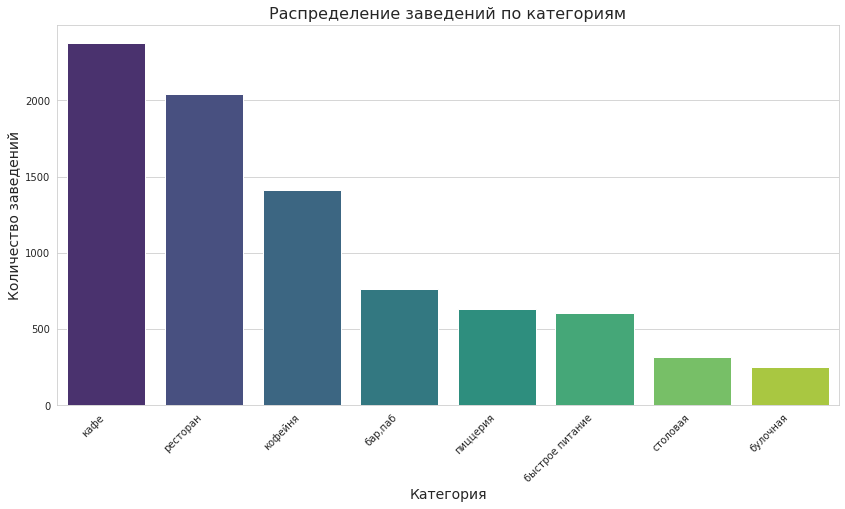

In [27]:
# Настройка стиля графиков
sns.set_style("whitegrid")

# Построение графика
plt.figure(figsize=(14,7))
category_counts_plot = sns.barplot(x=category_counts.index, 
                                   y=category_counts.values,
                                   palette="viridis")

# Добавление подписей
plt.title("Распределение заведений по категориям", fontsize=16)
plt.ylabel("Количество заведений", fontsize=14)
plt.xlabel("Категория", fontsize=14)
category_counts_plot.set_xticklabels(category_counts_plot.get_xticklabels(), rotation=45, ha="right")

# Отображение
plt.show()

Кафе, рестораны и кофейни являются тройкой лидеров по количеству заведений.  В то же время бары/пабы, быстрое питание и пиццерии также держат свою долю рынка. Булочные и столовые занимают последнее место по количеству, что объясняется тем, что они ориентированы на определенный сегмент рынка.

##### Исследование количества посадочных мест

In [28]:
# Агрегация данных по категориям заведений
seats_stats = places.groupby('category')['seats'].agg(['mean', 'median', 'min', 'max']).reset_index()

# Вывод результатов
display(seats_stats)

,category,mean,median,min,max
0,"бар,паб",124.477516,82.0,0.0,1288.0
1,булочная,88.115646,50.0,0.0,625.0
2,быстрое питание,98.891117,65.0,0.0,1040.0
3,кафе,97.365653,60.0,0.0,1288.0
4,кофейня,111.199734,80.0,0.0,1288.0
5,пиццерия,94.496487,55.0,0.0,1288.0
6,ресторан,121.817680,86.0,0.0,1288.0
7,столовая,99.750000,75.5,0.0,1200.0


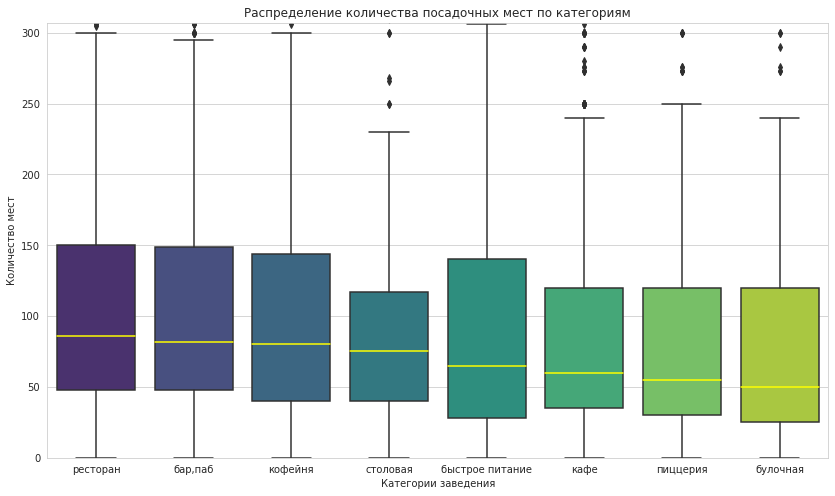

In [29]:
# Устанавливаем размер графика
plt.figure(figsize = (14,8))

# Вычисляем медианные значения для каждой категории
medians = places.groupby('category')['seats'].median().sort_values(ascending = False)


# Строим boxplot
sns.boxplot(data = places,
            x = 'category',
            y = 'seats', 
            palette="viridis",
            medianprops=dict(color="yellow", label='median'),
           order = medians.index)

# Устанавливаем лимит отображения оси игрек 95 персентиль
plt.ylim(0, places['seats'].quantile(0.95))

# Устанавливаем названия осей и заголовок
plt.xlabel('Категории заведения')
plt.ylabel('Количество мест')
plt.title('Распределение количества посадочных мест по категориям')

# Отображение
plt.show()

Оказалось, что во всех заведениях в среднем примерно однинаковое количество мест от 30 до 120, очень близкое распределение во всех категориях. Интересно, что чуть больше посадочных мест в ресторанах и барах, вероятно рассчет на более длительное пребывание в заведении. Булочные имеют относительно меньшее число мест, возможно, потому что они больше ориентированы на вынос. 

##### Анализ сетевых заведений

In [30]:
# процент круглосуточных заведений
places_chain_counts = places['chain'].value_counts()

In [31]:
places_chain_counts

0    5198
1    3202
Name: chain, dtype: int64

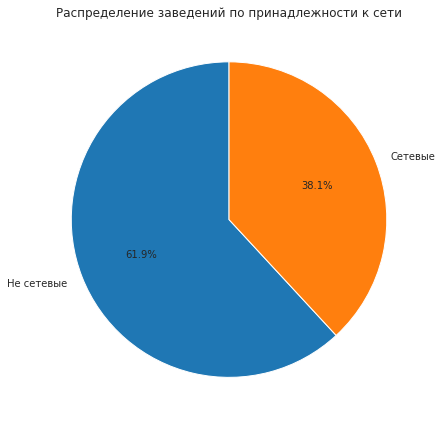

In [32]:
# Устанавливаем размер графика
plt.figure(figsize=(8, 6))

# Построение пироговой диаграммы
places_chain_counts.plot(kind='pie',
                         autopct='%1.1f%%', 
                         labels=['Не сетевые','Сетевые'],
                         startangle=90)

# Подпись к графику
plt.title('Распределение заведений по принадлежности к сети')
plt.ylabel('')  # скрыть название оси y

# Отображение графика
plt.tight_layout()
plt.show()

Большинство заведений (61%) не сетевые в Москве

In [33]:
# Группировка данных
chain_counts = places.groupby(['category', 'chain']).size().unstack()

In [34]:
display(chain_counts)

chain,0,1
category,,
"бар,паб",596,168
булочная,99,156
быстрое питание,371,232
кафе,1598,779
кофейня,693,720
пиццерия,303,330
ресторан,1311,729
столовая,227,88


In [35]:
# Создание столбца с процентом сетевых заведений
chain_counts['chain_percentage'] = chain_counts[1] / (chain_counts[1] + chain_counts[0])

In [36]:
# Сортировка данных по проценту сетевых заведений
chain_counts = chain_counts.sort_values('chain_percentage', ascending=False)

In [37]:
display(chain_counts)

chain,0,1,chain_percentage
category,,,
булочная,99,156,0.611765
пиццерия,303,330,0.521327
кофейня,693,720,0.509554
быстрое питание,371,232,0.384743
ресторан,1311,729,0.357353
кафе,1598,779,0.327724
столовая,227,88,0.279365
"бар,паб",596,168,0.219895


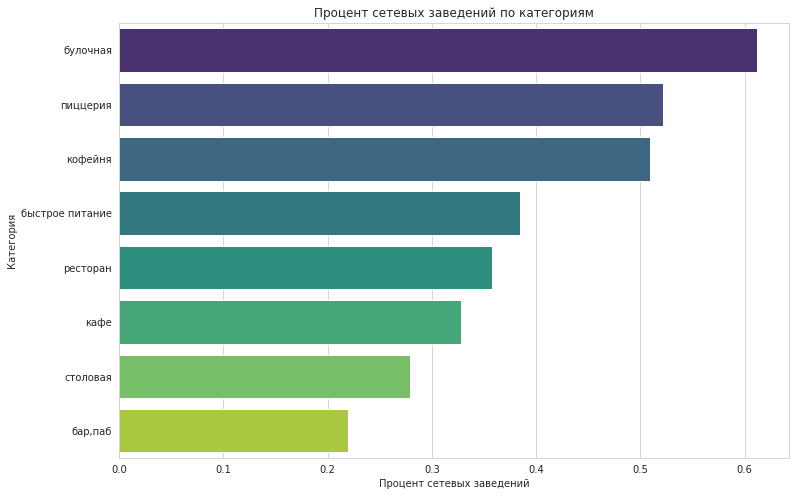

In [38]:
# Задаем размер графика
plt.figure(figsize = (12,8))

# Строим боксплот
sns.barplot(y = chain_counts.index, x = chain_counts['chain_percentage'], palette="viridis")

# Задаем названия осей
plt.title('Процент сетевых заведений по категориям')
plt.xlabel('Процент сетевых заведений')
plt.ylabel('Категория')

# отображение
plt.show()

Булочные наиболее склонны к сетевому формату: больше 61% булочных являются сетевыми. Пиццерии и кофейни также демонстрируют большую склонность к сетевому формату, с показателями примерно 52% и 51%. Столовые и бары/пабы наименее склонны к сетевому формату с показателями в 28% и 22% соответственно. Можно предположить, что столовые чаще всего являются индивидуальными предприятиями, обслуживающими определенную аудиторию, например, студентов или рабочих. Бары и пабы также не склонны к сетевому формату, наверное, хотят  сохранять уникальность своих заведений.

##### Анализ наиболее популярных заведений 

Посмотрим пока топ 20 сетевых заведений по распространенности - по количеству точек.

In [39]:
# Отфильтровать только сетевые заведения
chain_places = places[places['chain'] == True]

In [40]:
# выбрать топ 20 сетевых заведений по количеству
top_20 = chain_places.groupby('name').size().sort_values(ascending = False).head(20)


In [41]:
display(top_20)

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
CofeFest                                32
Буханка                                 32
Му-Му                                   27
Drive Café                              24
Кофемания                               23
АндерСон                                22
Крошка Картошка                         20
French Bakery                           20
dtype: int64

Такие общие названия как "Кафе", "Шаурма", "Ресторан", "Столовая" и "Яндекс Лавка" вряд ли могут быть названиями конкретных сетевых заведений, поэтому считаю их стоит выкинуть из рассмотрения.

In [42]:
# Отфильтруем данные убрав некорректные названия заведений
exclude_names = ['Кафе', 'Шаурма', 'Ресторан', 'Столовая', 'Яндекс Лавка', 'Хинкальная']
filtered_places = chain_places[~chain_places['name'].isin(exclude_names)]

In [43]:
# отберем непосредственно 15 по заданию
filtered_top_15 = filtered_places.groupby('name').size().sort_values(ascending = False).head(15)

In [44]:
display(filtered_top_15)

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Cofix                                   65
Prime                                   50
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
CofeFest                                32
Буханка                                 32
Му-Му                                   27
Drive Café                              24
Кофемания                               23
dtype: int64

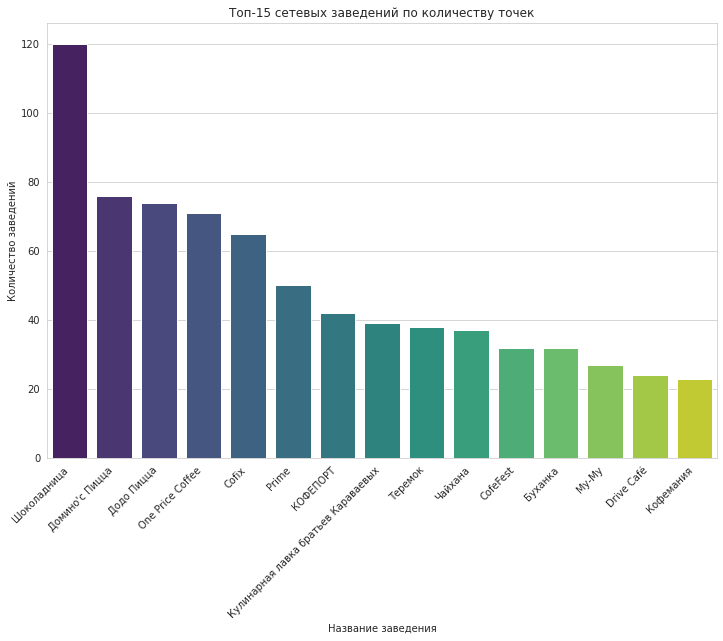

In [45]:
# задаем размер
plt.figure(figsize = (12,8))

# построение барплота
sns.barplot(x = filtered_top_15.index, y = filtered_top_15.values, palette="viridis")

# добавление подписей
plt.title('Топ-15 сетевых заведений по количеству точек')
plt.xlabel('Название заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 45, ha = 'right')

# отображение
plt.show()

Такой список мне нравится больше, отберем данные только из этого списка, чтобы с ними поработать.

In [46]:
filtered_data_top_15 = filtered_places[filtered_places['name'].isin(filtered_top_15.index)]

In [47]:
filtered_data_top_15.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 750 entries, 13 to 7981
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               750 non-null    object 
 1   category           750 non-null    object 
 2   address            750 non-null    object 
 3   district           750 non-null    object 
 4   hours              741 non-null    object 
 5   lat                750 non-null    float64
 6   lng                750 non-null    float64
 7   rating             750 non-null    float64
 8   price              234 non-null    object 
 9   avg_bill           388 non-null    object 
 10  middle_avg_bill    250 non-null    float64
 11  middle_coffee_cup  138 non-null    float64
 12  chain              750 non-null    int64  
 13  seats              486 non-null    float64
 14  street             750 non-null    object 
 15  is_24/7            750 non-null    bool   
dtypes: bool(1), float64(6), 

Посмотрим на эти заведения более детально.

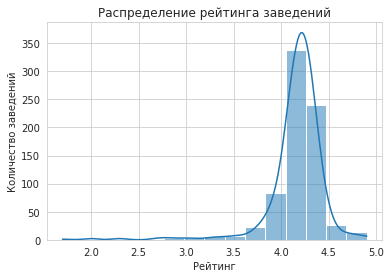

In [48]:
# распределение рейтинга заведений
sns.histplot(data=filtered_data_top_15,
             x='rating',
             bins=15, 
             kde=True)

# добавляем подписи
plt.title('Распределение рейтинга заведений')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')

# отображение
plt.show()

В основном, у этих заведений не плохой рейтинг, больше 4 из 5 возможных баллов.

In [49]:
# группировка по категориям
category_counts = filtered_data_top_15['category'].value_counts()

In [50]:
category_counts

кофейня            358
пиццерия           151
кафе               105
ресторан           103
булочная            25
быстрое питание      6
столовая             1
бар,паб              1
Name: category, dtype: int64

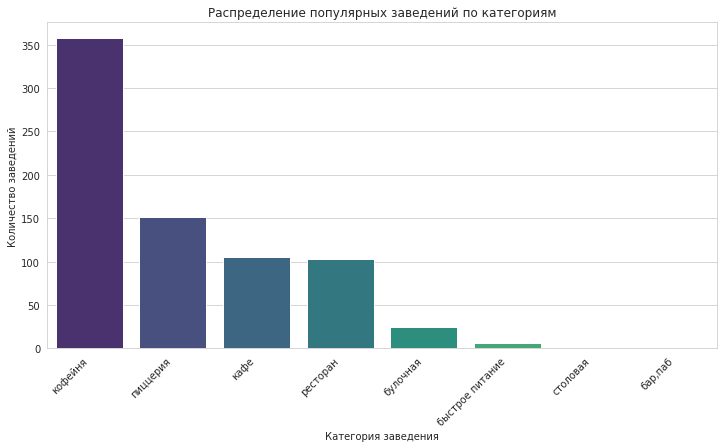

In [52]:
# Устанавливаем размер графика
plt.figure(figsize=(12, 6))

# Построение графика
sns.barplot(x=category_counts.index, y=category_counts.values, palette="viridis")

# Добавление заголовка и подписей
plt.title('Распределение популярных заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')

# Выводим график на экран
plt.show()

Кофейни являются наиболее распространенным видом заведений в этой выборке. Их число превышает все остальные категории, составляя 358 заведений. Пиццерии занимают второе место с 151 заведением. Кафе и рестораны имеют почти одинаковое количество заведений (105 и 103 соответственно). Все остальные категории занимают незначительный процент.

In [53]:
district_counts = filtered_data_top_15['district'].value_counts().head(15)

In [54]:
district_counts

Центральный административный округ         212
Северный административный округ             89
Западный административный округ             87
Южный административный округ                78
Северо-Восточный административный округ     77
Восточный административный округ            61
Юго-Западный административный округ         59
Юго-Восточный административный округ        45
Северо-Западный административный округ      42
Name: district, dtype: int64

In [55]:
# Вычисляем процентное соотношение для каждого района
district_counts_percentage = (district_counts / district_counts.sum()) * 100

# Объединяем данные о количестве и процентах в одну таблицу
district_summary = pd.DataFrame({
    'Count': district_counts,
    'Percentage': district_counts_percentage
})

# Отображаем таблицу
display(district_summary)


,Count,Percentage
Центральный административный округ,212,28.266667
Северный административный округ,89,11.866667
Западный административный округ,87,11.600000
Южный административный округ,78,10.400000
Северо-Восточный административный округ,77,10.266667
Восточный административный округ,61,8.133333
Юго-Западный административный округ,59,7.866667
Юго-Восточный административный округ,45,6.000000
Северо-Западный административный округ,42,5.600000


In [56]:
# district_counts.plot(kind='pie',
#                      autopct='%1.1f%%', 
#                      startangle=90,
#                      figsize=(8, 6))
# plt.title('Топ-15 районов по количеству заведений')
# plt.ylabel('')  # скрыть название оси y
# plt.show()

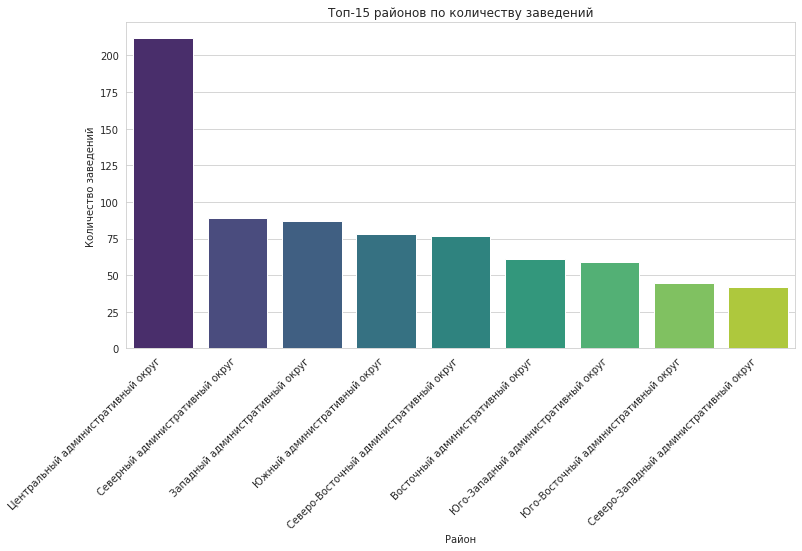

In [57]:
# Устанавливаем размер графика
plt.figure(figsize=(12, 6))

# Построение графика
sns.barplot(x=district_counts.index, y=district_counts.values, palette="viridis")

# Добавление заголовка и подписей
plt.title('Топ-15 районов по количеству заведений')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')

# Выводим график на экран
plt.show()

 Центральный административный округ является лидером по количеству заведений (28%) из топ-15, что подтверждает его статус наиболее активного и посещаемого района. В то время как Юго-Восточный и Северо-Западный административные округа наименее популярны, их процент от общего числа заведений из топ-15 не больше 10%

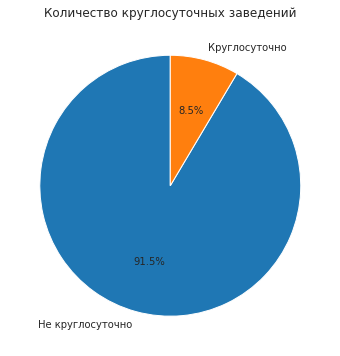

In [58]:
# процент круглосуточных заведений
work_mode_counts = filtered_data_top_15['is_24/7'].value_counts()
work_mode_counts.plot(kind='pie', 
                      autopct='%1.1f%%',
                      startangle=90,
                      labels=['Не круглосуточно', 'Круглосуточно'], 
                      figsize=(8, 6))
plt.title('Количество круглосуточных заведений')
plt.ylabel('')  # скрыть название оси y
plt.show()

91 процент топ 15 заведений не работают круглосуточно.

Таким образом популярные заведения из топ-15 самых распространенных на 91% не предоставляют круглосуточное обслуживание. В центре Москвы расположено 28% из всех популярных заведений, в то время как другие районы занимают не более 10%. Наибольшую долю составляют кафейни – почти 50%, далее идут пиццерии с 20%, кафе – 14% и рестораны – 13%. Прочие категории заведений в этом списке занимают незначительную долю. В целом, заведения из топ-15 обладают достойным рейтингом, превышающим 4 из возможных 5 баллов. Эти данные говорят о выской популярности кофеен среди заведений общественного питания Москвы, однако, среди них будет самая высокая конкуренция.

##### Анализ административных районов

In [59]:
# подсчет количества заведений с группировкой по району
district_counts = places['district'].value_counts()

In [60]:
district_counts

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     889
Западный административный округ             849
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [61]:
# Вычисляем процентное соотношение для каждого района
district_counts_percentage = (district_counts / district_counts.sum()) * 100

# Объединяем данные о количестве и процентах в одну таблицу
district_summary = pd.DataFrame({
    'Count': district_counts,
    'Percentage': district_counts_percentage
})

# Отображаем таблицу
display(district_summary)

,Count,Percentage
Центральный административный округ,2242,26.690476
Северный административный округ,898,10.690476
Южный административный округ,892,10.619048
Северо-Восточный административный округ,889,10.583333
Западный административный округ,849,10.107143
Восточный административный округ,798,9.500000
Юго-Восточный административный округ,714,8.500000
Юго-Западный административный округ,709,8.440476
Северо-Западный административный округ,409,4.869048


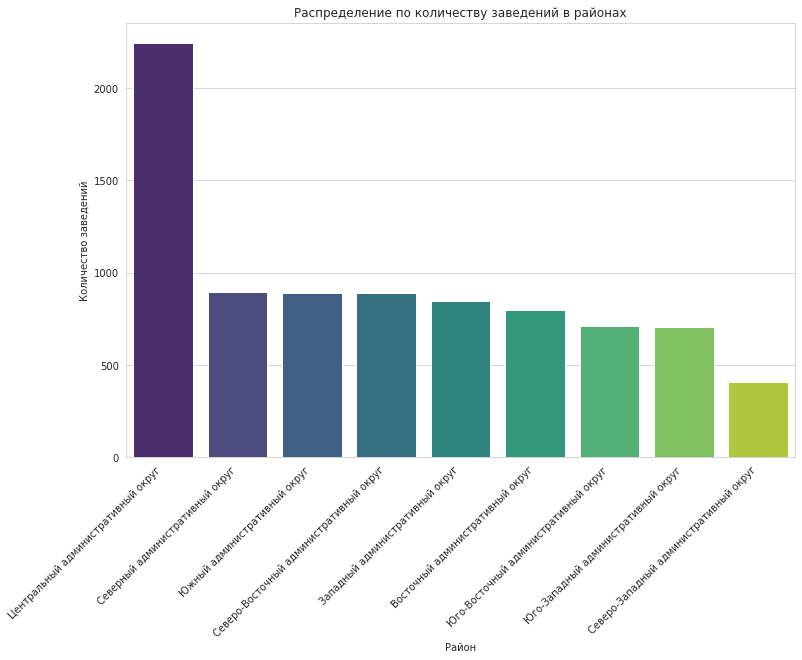

In [63]:
# Устанавливаем размер графика
plt.figure(figsize=(12, 8))

# Построение графика
sns.barplot(x=district_counts.index,
            y=district_counts.values, 
            palette="viridis")

# Добавление заголовка и подписей осей
plt.title('Распределение по количеству заведений в районах')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')

# Выводим график 
plt.show()


Центральный административный округ является наиболее популярным местом для размещения заведений, занимая около четверти всех заведений (26.7%).
Остальные округа имеют примерно равное распределение по количеству заведений, варьируясь в пределах 8.5% - 10.7%. Единственное исключение — Северо-Западный административный округ, где всего 4.9% заведений от общего числа.

Отобразим все заведения на карте

In [64]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
my_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Создаем объект MarkerCluster
marker_cluster = MarkerCluster().add_to(my_map)

# Пройдемся по каждому заведению и добавьте его на карту внутри кластера
for idx, row in places.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        icon=folium.Icon(icon="cutlery"),
    ).add_to(marker_cluster)
# выводим карту    
my_map

Распределение всех заведений по районам очень похоже на срез топ-15 заведений, из чего можно сделать вывод, что успешность заведения не слишком сильно зависит от месторасположения. В любом случае чуть больше четверти располагаются в центре Москвы, что ожидаемо.

In [65]:
# Создаем сводную таблицу
pivot_table = places.pivot_table(index='district', columns='category', values='name', aggfunc='count').fillna(0)

In [66]:
pivot_table

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,36,62,238,150,71,218,24
Северный административный округ,68,39,58,235,193,77,187,41
Северо-Восточный административный округ,62,28,82,269,159,68,181,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


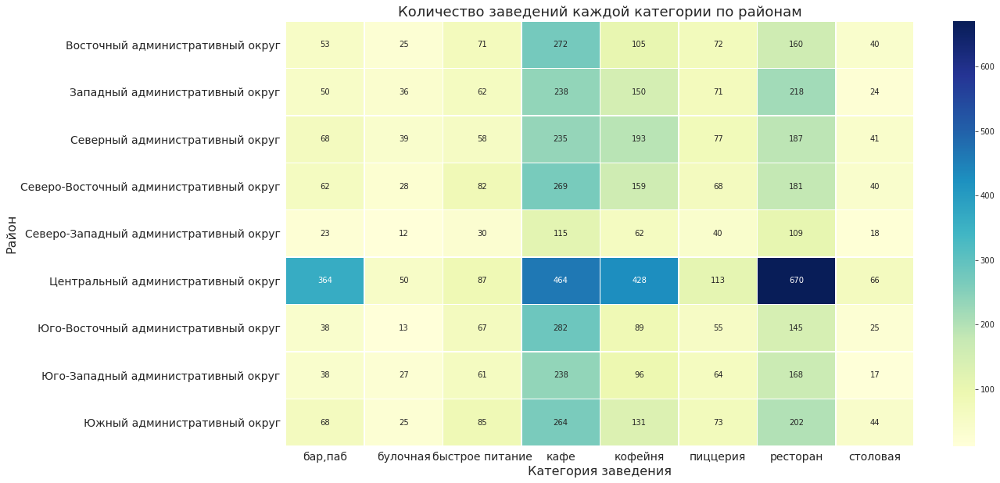

In [67]:
# Устанавливаем размер графика
plt.figure(figsize=(18, 10))

# Создаем тепловую карту на основе сводной таблицы
sns.heatmap(pivot_table, 
            cmap="YlGnBu",
            annot=True,
            fmt=".0f",
            linewidths=0.5)

# Добавляем заголовок к графику
plt.title('Количество заведений каждой категории по районам', fontsize=18)
plt.xlabel('Категория заведения', fontsize=16)
plt.ylabel('Район', fontsize=16)

# Увеличиваем размер подписей осей
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


# Выводим
plt.show()

Явно выделяется по числу заведений почти всех категорий, особенно по ресторанам, кафе и кофейням Центральный округ. Все остальные районы кажется имеют приблизительно одинаковое распределение заведений. Что касается популярности конкрентых типов заведений: Кафе наиболее популярны во всех районах, особенно в ЦАО, Юго-Восточном, Южном и Северо-Восточном административных округах. Кофейни активно распространены в Центральном и чуть меньше в Северном административных округах.

##### Анализ взаимосвязи рейтинов и категорий завдения  

In [68]:
# Вычисление среднего рейтинга для каждой категории
categories_rating = places.groupby('category')['rating'].mean()

In [69]:
categories_rating 

category
бар,паб            4.387696
булочная           4.269020
быстрое питание    4.050249
кафе               4.123896
кофейня            4.277282
пиццерия           4.301264
ресторан           4.290392
столовая           4.211429
Name: rating, dtype: float64

In [70]:
# сортировка по медиане для графика
sorted_categories = categories_rating.sort_values(ascending=False).index

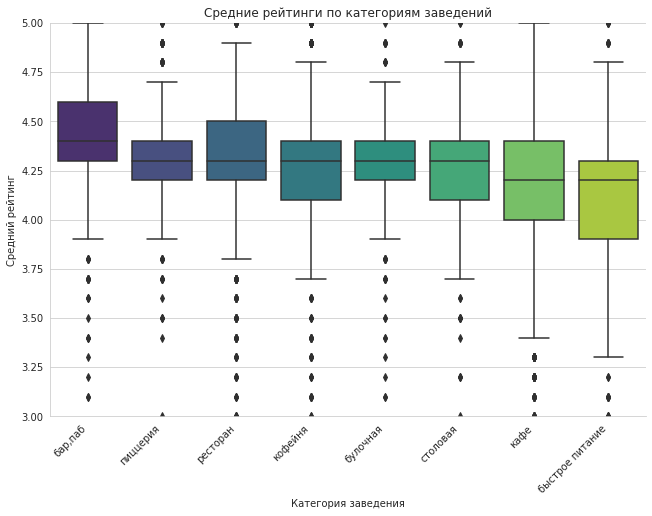

In [71]:
# построение графика
sns.catplot(data=places,
            x="category",
            y="rating", 
            kind="box",
            palette="viridis",
            order=sorted_categories,
           height=6,
           aspect=1.5)

# подписи осей
plt.title('Средние рейтинги по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45, ha='right')
plt.ylim(3, 5) 

# отображение
plt.show()

Общий вывод может заключаться в том, что большинство заведений в Москве имеют довольно высокий средний рейтинг, что говорит о хорошем качестве их услуг, однако, скорее всего рейтинги "накрученные". Так или инчае из графика следует,что наибольший средний рейтинг имеет категория пабы и бары, в то время как наименьший средний рейтинг и сильный разброс в катеогрии быстрое питание.

##### Анализ рейтигна заведений по районам

Построим картограмму (хороплет) со средним рейтингом заведений каждого района.

In [72]:
# Группировка данных по районам и вычисление медианы средних чеков для каждого района
median_rating_per_district = places.groupby('district')['rating'].mean().sort_values(ascending = False)

# Вывод результата
display(median_rating_per_district)

district
Центральный административный округ         4.377520
Северный административный округ            4.239866
Северо-Западный административный округ     4.208802
Южный административный округ               4.184417
Западный административный округ            4.181743
Восточный административный округ           4.174185
Юго-Западный административный округ        4.172920
Северо-Восточный административный округ    4.147694
Юго-Восточный административный округ       4.101120
Name: rating, dtype: float64

In [73]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_rating_per_district ,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

В целом обращает на себя внимание маленькая вариабельность рейтингов, разница между максимальным и минимальным рейтингами составляет всего 0.28 балла. Это говорит о том, что качество сервиса и предоставляемых услуг в заведениях по всему городу довольно стабильно. Наибольший рейтинг у Центрального административного округа: Заведения в Центральном административном округе имеют самый высокий средний рейтинг, равный 4.37.

##### Топ-15 улиц по количеству заведений

In [74]:
# Находим топ-15 улиц по количеству заведений
top_15_streets = places['street'].value_counts().head(15).index

In [75]:
top_15_streets

Index(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского',
       'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе',
       'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'МКАД',
       'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект',
       'улица Миклухо-Маклая', 'Пятницкая улица'],
      dtype='object')

In [76]:
# Фильтруем данные только по этим улицам
filtered_places = places[places['street'].isin(top_15_streets)]

In [77]:
filtered_places.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1257 entries, 8 to 8404
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1257 non-null   object 
 1   category           1257 non-null   object 
 2   address            1257 non-null   object 
 3   district           1257 non-null   object 
 4   hours              1177 non-null   object 
 5   lat                1257 non-null   float64
 6   lng                1257 non-null   float64
 7   rating             1257 non-null   float64
 8   price              479 non-null    object 
 9   avg_bill           556 non-null    object 
 10  middle_avg_bill    469 non-null    float64
 11  middle_coffee_cup  71 non-null     float64
 12  chain              1257 non-null   int64  
 13  seats              773 non-null    float64
 14  street             1257 non-null   object 
 15  is_24/7            1257 non-null   bool   
dtypes: bool(1), float64(6), 

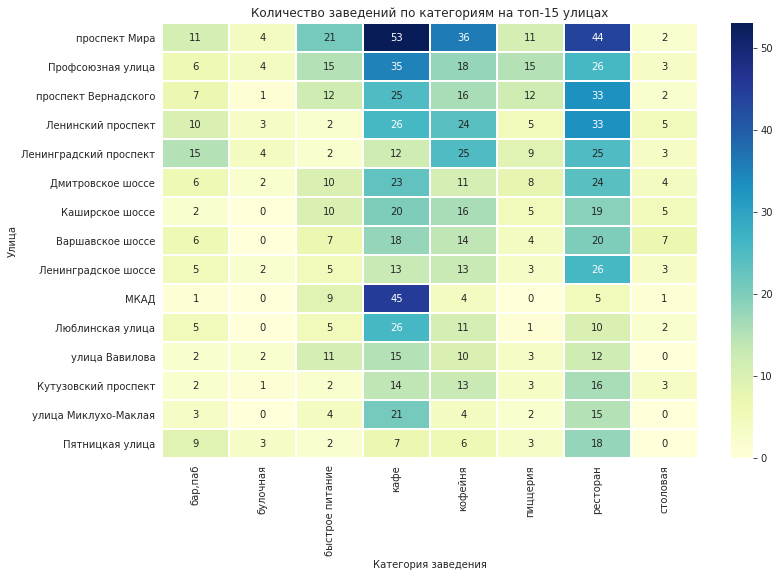

In [78]:
# Создаем сводную таблицу
pivot_table = filtered_places.pivot_table(index='street', 
                                          columns='category', 
                                          values='name', 
                                          aggfunc='count').fillna(0)

# Сортировка по общему количеству заведений на улице
pivot_table = pivot_table.loc[top_15_streets]

# Построение heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', linewidths=.5)
plt.title('Количество заведений по категориям на топ-15 улицах')
plt.ylabel('Улица')
plt.xlabel('Категория заведения')

# отображение
plt.show()


Наиболее популярная категория заведений — это кафе. Преимущественно на всех улицах их количество превышает другие категории. Похоже множество кафе располагается на МКАДе (45 шт.) и проспекте Мира (53 шт.). Кроме того, на проспекте Мира много ресторанов. Очень мало на этих улицах булочных и столовых. Интересно, что кофейни хорошо распределены по всем улицам, но особенно много их на проспекте Мира, Ленинском проспекте и Ленинградском проспекте.

<div class="alert alert-success">
<b>✔️ Комментарий ревьюера v1:</b> 
<br>Согласен с полученными результатами, что не удивительно, ведь проспект Мира одна из самых больших и популярных улиц столицы
</div>

Но почему именно на этих улицах больше всего заведений? Попробуем расположить заведения из топ-15 улиц на карте.

In [79]:
# создаём карту Москвы
my_map = Map(location=[moscow_lat, moscow_lng], zoom_start=11, tiles='Cartodb Positron')

# Пройдемся по каждому заведению и добавьте его на карту внутри кластера
for idx, row in filtered_places.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        icon=folium.Icon(icon="cutlery"),
    ).add_to(my_map)
    
# выводим карту    
my_map

Похоже эти улицы лидируют по количеству заведений лишь по причине, что это самые длинные улицы Москвы.

##### Анализ улиц, на которых находится только один объект общепита

In [80]:
# Группируем данные по улицам и считаем количество объектов на каждой из них
streets_count = places.groupby('street').size()

# Фильтруем улицы, на которых только одно заведение
single_places_streets = streets_count[streets_count == 1].index.tolist()

print(f"Количество улиц с одним объектом общепита: {len(single_places_streets)}")

Количество улиц с одним объектом общепита: 456


Всего 456 улиц с один заведением питания. Посмотрим есть ли взаимосвязь с местом расположения, отметив на карте.

In [81]:
filtered_places = places[places['street'].isin(single_places_streets)]

In [82]:
# создаём карту Москвы
my_map = Map(location=[moscow_lat, moscow_lng], zoom_start=11, tiles='Cartodb Positron')

# Пройдемся по каждому заведению и добавьте его на карту внутри кластера
for idx, row in filtered_places.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        icon=folium.Icon(icon="cutlery"),
    ).add_to(my_map)
    
# выводим карту    
my_map

Кажется улицы с один заведением равномерно распределены на карте. Посмтрим на названия улиц.

In [83]:
# выведем рандомные 30 потому что все 400 выводить не удобно
import random

random_sample = random.sample(single_places_streets, 30)
print(random_sample)

['улица Кашёнкин Луг', 'Триумфальная площадь', 'улица Вучетича', '11-я Парковая улица', 'Стахановская улица', 'Сумской проезд', '2-я Рощинская улица', 'Большой Строченовский переулок', 'Московский проспект', '2-й Хорошёвский проезд', 'улица Генерала Дорохова', 'Мансуровский переулок', 'Старокаширское шоссе', 'Игарский проезд', '1-й Автозаводский проезд', 'Задонский проезд', 'Электрический переулок', 'природно-исторический парк Измайлово', 'проезд Якушкина', 'Крылатский мост', 'улица Ремизова', 'Михайловский проезд', 'Прибрежный проезд', 'Андроньевская площадь', 'Верхоянская улица', '1-й Самотёчный переулок', 'парк Тюфелева роща', '2-я Владимирская улица', 'Малая Почтовая улица', 'Малый Патриарший переулок']


Улицы малоизвестные, вероятно их связывает малая протяженность. Если улицы короткие, и на них физически нет места для размещения большого числа заведений. Выясним какого характера эти заведения.

In [84]:
#  Считаем количество заведений каждой категории на улицах с одним объектом
category_counts = filtered_places['category'].value_counts()

In [85]:
category_counts

кафе               159
ресторан            93
кофейня             83
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [86]:
# Вычисляем процентное соотношение для каждого района
small_category_counts_percentage = (category_counts / category_counts.sum()) * 100

# Объединяем данные о количестве и процентах в одну таблицу
small_category_summary = pd.DataFrame({
    'Count': category_counts,
    'Percentage': small_category_counts_percentage
})

# Отображаем таблицу
display(small_category_summary)

,Count,Percentage
кафе,159,34.868421
ресторан,93,20.394737
кофейня,83,18.201754
"бар,паб",39,8.552632
столовая,36,7.894737
быстрое питание,23,5.043860
пиццерия,15,3.289474
булочная,8,1.754386


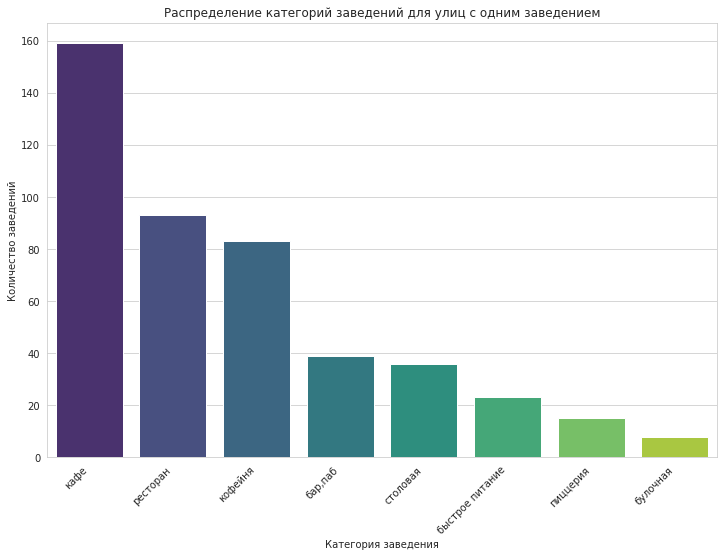

In [88]:
# Устанавливаем размер графика
plt.figure(figsize=(12, 8))

# Построение графика
sns.barplot(x=category_counts.index, 
            y=category_counts.values,
            palette="viridis")

# Добавление заголовка к графику
plt.title('Распределение категорий заведений для улиц с одним заведением')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')

# Выводим график
plt.show()

Похоже в маленьких переулках чаще всего располагаются кафе (34.9%) Рестораны и кофейни занимают второе и третье место по популярности, 20.4% и 18.2% соответственно. Бары и пабы менее популярны (8.6%), и остальные занимают менее значительные проценты. Булоные и пиццерии на последнем месте.

##### Анализ среднего чека

In [89]:
# Группировка данных по районам и вычисление медианы средних чеков для каждого района
median_bill_per_district = places.groupby('district')['middle_avg_bill'].median().sort_values(ascending = False)

# Вывод результата
display(median_bill_per_district)

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

In [90]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
bill_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill_per_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(bill_map)

# выводим карту
bill_map

Высокая медиана среднего чека в Центральном и Западном административных округах (1000 у.е.). Восточный, Северо-Восточный, Южный и Юго-Восточный административные округа: Здесь медианный средний чек самый низкий (450-550 у.е.)

##### Анализ часов работы заведений

In [91]:
# посмотрим какие уникальные значения столбца
places['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [92]:
# Проверка на "ежедневно", добавим столбец со значеним True или False 
places['daily'] = places['hours'].apply(lambda x: True if re.search('ежедневно', str(x)) else False)

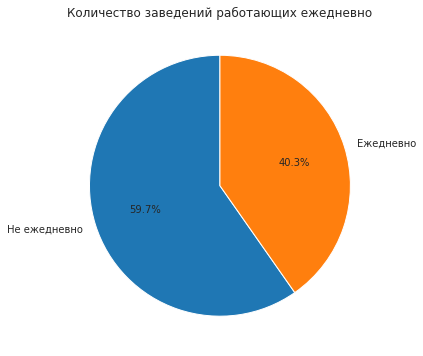

In [93]:
# процент заведений работающих ежедневно
work_mode_counts = places['daily'].value_counts()
work_mode_counts.plot(kind='pie', 
                      autopct='%1.1f%%',
                      startangle=90,
                      labels=['Не ежедневно', 'Ежедневно'], 
                      figsize=(8, 6))
plt.title('Количество заведений работающих ежедневно')
plt.ylabel('')  # скрыть название оси y
plt.show()

Почти 60 процентов заведений работают не ежедневно. Посмотрим время открытия.

In [94]:
# Функция для извлечения времени начала работы

def extract_start_time(s):
    if pd.isna(s):
        return None
    match = re.search(r'(\d{2}:\d{2})–(\d{2}:\d{2})', s)
    if match:
        return match.group(1)
    return None

In [95]:
# Функция для извлечения времени завершения работы

def extract_end_time(s):
    if pd.isna(s):
        return None
    match = re.search(r'(\d{2}:\d{2})–(\d{2}:\d{2})', s)
    if match:
        return match.group(2)
    return None


In [96]:
# Применяем функции к столбцу 'hours'
places['start_time'] = places['hours'].apply(extract_start_time)
places['end_time'] = places['hours'].apply(extract_end_time)

In [97]:
# Функция для преобразования строкового времени в datetime.time
# Напрямую сделать не выходит, из-за пустых значений в столбце
def to_time_format(s):
    if s:
        return datetime.strptime(s, '%H:%M').time()
    return None

In [98]:
# Применяем функцию к столбцам start_time и end_time
places['start_time'] = places['start_time'].apply(to_time_format)
places['end_time'] = places['end_time'].apply(to_time_format)

In [99]:
# Преобразовываем время открытия в минуты с начала дня
places['start_minutes'] = places['start_time'].dropna().apply(lambda t: t.hour * 60 + t.minute)

In [100]:
# Группировка данных и вычисление среднего времени открытия для каждого типа заведения
average_opening_times = places.groupby('category')['start_minutes'].median().sort_values()


In [101]:
# функция для превращения минут в обычное время
def minutes_to_time(minutes):
    # Получаем часы путем целочисленного деления минут на 60
    hours = int(minutes // 60)
    
    # Получаем оставшиеся минуты с помощью остатка от деления
    mins = int(minutes % 60)
    
    # Возвращаем время в формате "часы:минуты"
    return f"{hours}:{mins:02}"  
    # "mins:02" обеспечивает вывод минут в формате из двух цифр (например, "8:05" вместо "8:5")


In [102]:
formatted_time = average_opening_times.apply(minutes_to_time)

# Добавляем новый столбец с форматированным временем
average_opening_times = average_opening_times.to_frame(name='minutes')
average_opening_times['formatted_time'] = formatted_time

In [103]:
average_opening_times

,minutes,formatted_time
category,,
булочная,480.0,8:00
кофейня,480.0,8:00
столовая,540.0,9:00
быстрое питание,600.0,10:00
кафе,600.0,10:00
пиццерия,600.0,10:00
ресторан,600.0,10:00
"бар,паб",675.0,11:15


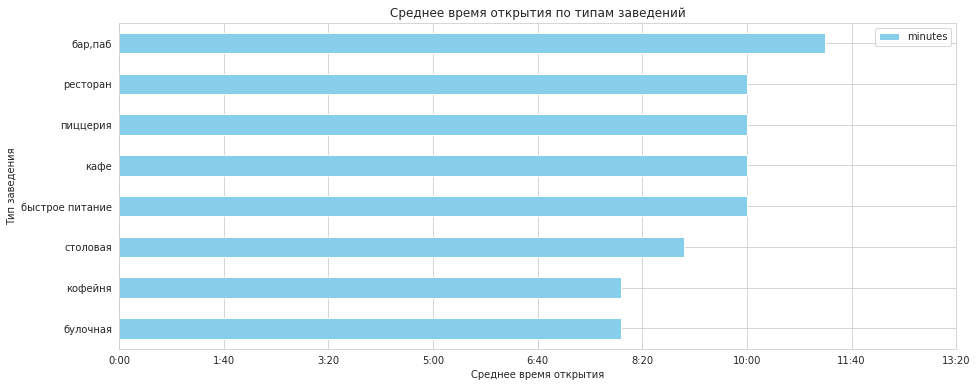

In [104]:
# Построение столбчатой диаграммы

average_opening_times.plot(kind='barh',
                           color='skyblue',
                          figsize=(15, 6))

# Преобразование меток на оси x в часы и минуты
x_ticks_in_hours = [minutes_to_time(minute) for minute in plt.xticks()[0]]
plt.xticks(plt.xticks()[0], x_ticks_in_hours)

# добавляем подписи
plt.xlabel('Среднее время открытия')
plt.ylabel('Тип заведения')
plt.title('Среднее время открытия по типам заведений')

# отображение
plt.show()


Булочные и кофейни обычно начинают свою работу раньше других, в 8:00 утра. Столовые открываются чуть позже, в 9:00 утра. 
Быстрое питание, кафе, пиццерии и рестораны в среднем начинают работать в 10:00 утра. Бары и пабы начинают свою работу позже всех, в среднем в 11:30 утра. 

Теперь посмотрим когда заведения закрываются

In [105]:
# Преобразовываем время открытия в минуты с начала дня
places['end_minutes'] = places['end_time'].dropna().apply(lambda t: t.hour * 60 + t.minute)

In [106]:
# Группировка данных и вычисление среднего времени закрытия ткрытия для каждого типа заведения
average_end_times = places.groupby('category')['end_minutes'].median().sort_values()

In [107]:
formatted_time = average_end_times.apply(minutes_to_time)

# Добавляем новый столбец с форматированным временем
average_end_times = average_end_times.to_frame(name='minutes')
average_end_times['formatted_time'] = formatted_time

In [108]:
average_end_times

,minutes,formatted_time
category,,
"бар,паб",120.0,2:00
столовая,1080.0,18:00
кафе,1290.0,21:30
кофейня,1290.0,21:30
булочная,1320.0,22:00
быстрое питание,1320.0,22:00
пиццерия,1320.0,22:00
ресторан,1320.0,22:00


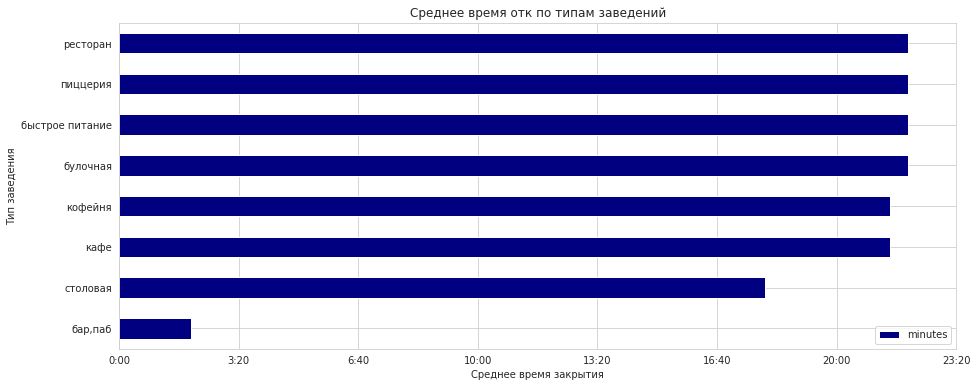

In [109]:
# Построение столбчатой диаграммы

average_end_times.plot(kind='barh',
                       color='navy',
                      figsize=(15, 6))

# Преобразование меток на оси x в часы и минуты
x_ticks_in_hours = [minutes_to_time(minute) for minute in plt.xticks()[0]]
plt.xticks(plt.xticks()[0], x_ticks_in_hours)

# подписи
plt.xlabel('Среднее время закрытия')
plt.ylabel('Тип заведения')
plt.title('Среднее время отк по типам заведений')

# отображение
plt.show()

Столовая закрывается в 18:00. Это логично, так как столовые предназначены для еды в рабочее время.
Большинство других заведений, таких как кафе, кофейни, булочные, места быстрого питания, пиццерии и рестораны, закрываются в 22:00. Бары/Пабы закрываются позднее всех остальных заведений, в 02:00.

##### **Подвывод по разделу анализ рынка заведений общепита**

- Топ категорий заведений. Лидеры: Кафе, рестораны и кофейни. Средний уровень: Бары/пабы, быстрое питание, пиццерии. Наименее распространенные: Булочные и столовые, что связано с их специфической ориентацией.

- Посадочные места. Похожее количество мест в разных категориях: от 30 до 120. Больше всего мест: в ресторанах и барах (длительное пребывание). Меньше всего мест: в булочных (возможно, из-за ориентации на вынос).

- Сетевой формат. Наиболее распространен среди: булочных (61%), пиццерий (52%) и кофеен (51%). Наименее распространен среди: столовых (28%) и баров/пабов (22%).

- Географическое распределение. Центральный административный округ является наиболее популярным местом для размещения заведений, занимая около четверти всех заведений (26.7%). Остальные округа имеют примерно равное распределение по количеству заведений, варьируясь в пределах 8.5% - 10.7%. Единственное исключение — Северо-Западный административный округ, где всего 4.9% заведений от общего числа.

- Круглосуточное обслуживание.  Большинство популярных заведений (91%) не работают круглосуточно.


- Рейтинг заведений. В целом обращает на себя внимание маленькая вариабельность рейтингов, разница между максимальным и минимальным рейтингами составляет всего 0.28 балла. Наибольший рейтинг у Центрального административного округа: Заведения в Центральном административном округе имеют самый высокий средний рейтинг, равный 4.37.

- Похоже в маленьких переулках чаще всего располагаются кафе (34.9%) Рестораны и кофейни занимают второе и третье место по популярности, 20.4% и 18.2% соответственно. Бары и пабы менее популярны (8.6%), и остальные занимают менее значительные проценты. Булоные и пиццерии на последнем месте.

- Средний чек. Центральный и Западный административные округа: 1000 у.е. Восточный, Северо-Восточный, Южный, Юго-Восточный: 450-550 у.е.

- Время работы. Все кроме пабов и баров открываются с 8 до 10 утра. Закрываются заведения почти все в 10 вечера, толко столовые в 6 вечера, и бары утром.


#### Детализируем исследование: открытие кофейни

##### Анализ ключевых показателей кофеен Москвы

In [110]:
# отфильтруем кофейни из данных и будем работать с ними
coffee_shops = places[places['category'] == 'кофейня'].copy()

In [111]:
# Подсчет количества кофеен 
number_of_coffee_shops = coffee_shops.shape[0]

print(f"В данных {number_of_coffee_shops} кофеен.")

В данных 1413 кофеен.


In [112]:
print("Средний рейтинг кофеен:", coffee_shops['rating'].mean())

Средний рейтинг кофеен: 4.27728237791932


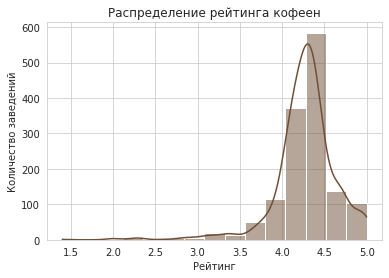

In [113]:
# распределение рейтинга кофеен
sns.histplot(data=coffee_shops,
             x='rating',
             bins=15, 
             kde=True,
            color='#6F4E37')

# подписи
plt.title('Распределение рейтинга кофеен')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')

# отображение
plt.show()

Рейтинги кофеен хороший, большинство в диапозоне от 4 до 5, медиана 4.3.

In [114]:
# расперделение кофеен по районам
district_counts_coffe_shops = coffee_shops['district'].value_counts()

In [115]:
district_counts_coffe_shops

Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64

In [116]:
# Вычисляем процентное соотношение для каждого района
district_counts_coffe_shops_percentage = (district_counts_coffe_shops / district_counts_coffe_shops.sum()) * 100

# Объединяем данные о количестве и процентах в одну таблицу
district_counts_coffe_shops_percentage_summary = pd.DataFrame({
    'Count': district_counts_coffe_shops,
    'Percentage':district_counts_coffe_shops_percentage
})

# Отображаем таблицу
display(district_counts_coffe_shops_percentage_summary)

,Count,Percentage
Центральный административный округ,428,30.290163
Северный административный округ,193,13.658882
Северо-Восточный административный округ,159,11.252654
Западный административный округ,150,10.615711
Южный административный округ,131,9.271054
Восточный административный округ,105,7.430998
Юго-Западный административный округ,96,6.794055
Юго-Восточный административный округ,89,6.298655
Северо-Западный административный округ,62,4.387827


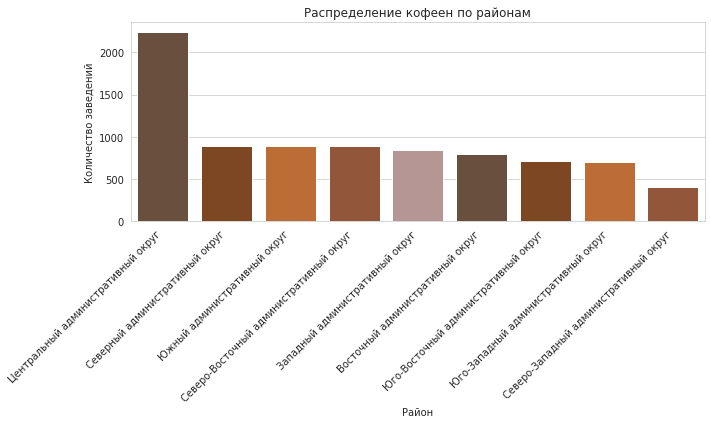

In [118]:
# кофейные оттенки для красоты
coffee_colors = ['#6F4E37', '#8B4513', '#D2691E', '#A0522D', '#BC8F8F']

# Устанавливаем размер графика
plt.figure(figsize=(10, 6))

# Построение графика 
sns.barplot(x=district_counts.index,
            y=district_counts.values,
            palette=coffee_colors * (len(district_counts) // len(coffee_colors) + 1))

# Подписи к графику
plt.title('Распределение кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # поворот названий районов для лучшего вида

# Отображение графика
plt.tight_layout()
plt.show()


Ожидаемо большой процент кофеен в центре, больше 400 кофеен в ЦАО, что 30% от всех кофеен в Москве, в то время как в остальных районах не больше 200 кофеен.

In [119]:
# создаём карту Москвы
coffee_shops_map = Map(location=[moscow_lat, moscow_lng], zoom_start=11, tiles='Cartodb Positron')

# Пройдемся по каждому заведению и добавьте его на карту внутри кластера
for idx, row in coffee_shops.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        icon=folium.Icon(icon="cutlery"),
    ).add_to(coffee_shops_map)
    
# выводим карту    
coffee_shops_map

Заведений конечно очень много, но если присмотреться, Западный административный округ не богат на кофейни, хотя там много мест притяжения: МГУ имени М. В. Ломоносова, Воробьёвы горы, Поклонная гора и Музей Победы.

In [120]:
# Агрегируем данные по районам, вычисляя медиану рейтинга для каждого района
median_ratings = coffee_shops.groupby('district')['rating'].mean().reset_index()

In [121]:
display(median_ratings.sort_values(by='rating', ascending=False))

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [122]:
# создаём карту Москвы
coffee_rating_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_ratings,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(coffee_rating_map)

# выводим карту
coffee_rating_map


Все кофейни имеют высокие рейтинги, все представленные административные округа имеют рейтинги кофеен в диапазоне от 4.19 до 4.33. Самый низкий в Западном административный округе, хотя разница не значительная.

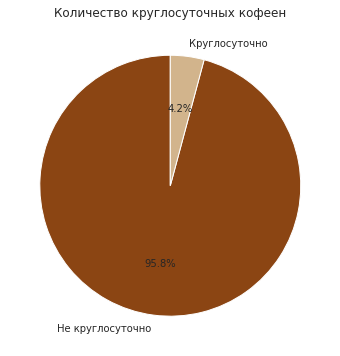

In [123]:
# процент круглосуточных кофеен
coffee_work_mode_counts = coffee_shops['is_24/7'].value_counts()

# темный кофейный и светло-кофейный цвета
colors = ['#8B4513', '#D2B48C']  
labels = ['Не круглосуточно', 'Круглосуточно']

coffee_work_mode_counts.plot(kind='pie', 
                             autopct='%1.1f%%',
                             startangle=90,
                             colors=colors,
                             labels=labels, 
                             figsize=(8, 6))

# подпси
plt.title('Количество круглосуточных кофеен')
plt.ylabel('')  # скрыть название оси y

# отображение
plt.show()

Всего 4% кофеен работают круглосуточно. Это логично, учитывая, что утром кофе наиболее популярен. Ночью спрос на кофе снижается, и поддержание работы заведения становится экономически нецелесообразным.

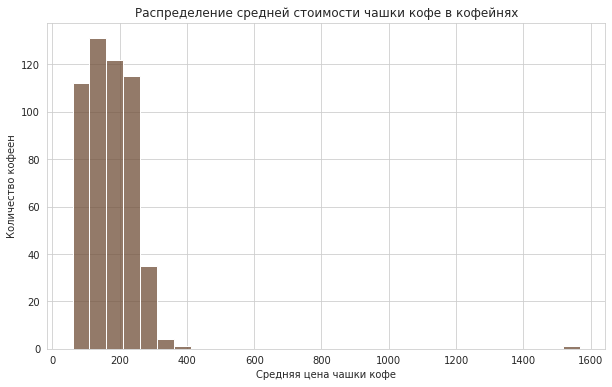

In [124]:
# Фильтрация датафрейма для удаления пропущенных значений в колонке middle_coffee_cup
coffee_shops_filtered = coffee_shops.dropna(subset=['middle_coffee_cup'])

# Построение гистограммы
plt.figure(figsize=(10, 6))
sns.histplot(coffee_shops_filtered['middle_coffee_cup'], bins=30, color="#6F4E37")

plt.title("Распределение средней стоимости чашки кофе в кофейнях")
plt.xlabel("Средняя цена чашки кофе")
plt.ylabel("Количество кофеен")
plt.show()


Неужели есть заведения с ценой за чашку больше 1000?

In [125]:
expensive_coffee_shops = coffee_shops[coffee_shops['middle_coffee_cup'] > 1000]

name = expensive_coffee_shops['name'].values[0]
price = expensive_coffee_shops['middle_coffee_cup'].values[0]

print(f"Название заведения: {name}. Цена за чашку: {price} ₽.")


Название заведения: Шоколадница. Цена за чашку: 1568.0 ₽.


На момент написания проекта в Шоколаднице не нашлось кофе за такую цену. Очевидно какая-то ошибка в данных. 

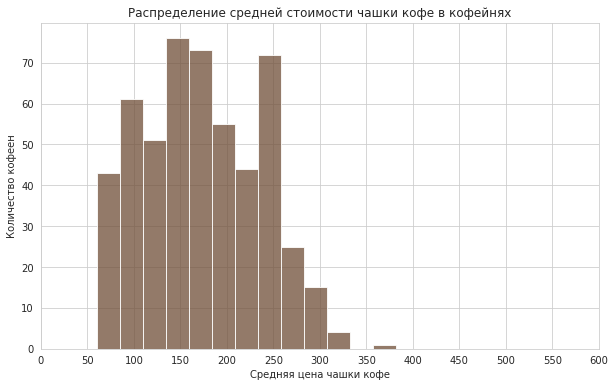

In [126]:
# Фильтрация датафрейма для удаления пропущенных значений в колонке middle_coffee_cup
coffee_shops_filtered = coffee_shops.dropna(subset=['middle_coffee_cup'])

# Построение гистограммы
plt.figure(figsize=(10, 6))
sns.histplot(coffee_shops_filtered['middle_coffee_cup'], color="#6F4E37")

plt.xlim(0, 500)
plt.xticks(np.arange(0, 601, 50))
plt.title("Распределение средней стоимости чашки кофе в кофейнях")
plt.xlabel("Средняя цена чашки кофе")
plt.ylabel("Количество кофеен")
plt.show()

Таким образом средняя цена за чашку в кофейнях Москвы от 75 до 325 рублей, два пика на 150 и 250 у.е.

##### **Подвывод по анализу кофеен Москвы** 
- В датасете представлено 1413 кофеен.
- Центральный административный округ (ЦАО) содержит 30% всех кофеен.
- Несмотря на множество объектов туристического притяжения, Западный административный округ имеет относительно мало кофеен, судя по данным с карт.
- Все кофейни имеют высокие рейтинги, все представленные административные округа имеют рейтинги кофеен в диапазоне от 4.19 до 4.33. Самый низкий в Западном административный округе, хотя разница не значительная.
- Только 4% кофеен функционируют 24/7.
- Средняя стоимость чашки кофе варьируется от 75 до 325 рублей, с основными пиками в 150 и 250 рублях.

##### Анализ конкурентов кофейни в ЗАО

Если вернуться к идее инвесторов из «Shut Up and Take My Money» открыть такую же кофейню как «Central Perk» из сериала друзья, мне кажется ЗАО хорошо подходит по нескольким причинам.

1. Чуть меньшая конкуренция: средний рейтинг кофеен чуть ниже в этом районе, что может свидетельствовать о том, что потребителям не хватает качественных заведений, и новое высококачественное место может найти свою аудиторию.

2. Пробелы на карте: Если в ЗАО есть районы без кофеен, это означает, что у нас есть возможность заполнить этот рыночный вакуум. Пробелы на карте могут указывать на неудовлетворенный спрос.

3. Название кофени, которое предлагают инвесторы, это переиграное "Central Park", по известному парку в Нью-Йорке. В Москве уже есть такое заведение, но оно располагается в парке Сокольники, в свою очередь ЗАО тоже богат парками, и название будет лучше соответстовать, чем если, например, расположить заведение в центре Москвы. 

4. ЗАО постоянно развивается, сюда приезжает много людей на работу и учебу. Это не спальный район, и там много туристов. Учитывая такой поток людей, спрос на кафе и кофейни будет только расти, а значит среднюю цену за чашку можно сделать чуть выше. 


Если мы решим все таки открыть кофеню в ЗАО можно посмотреть на некоторые показатели поближе.

In [127]:
zao_coffee_shops = coffee_shops.loc[coffee_shops['district'] == 'Западный административный округ']

In [128]:
zao_coffee_shops.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150 entries, 3013 to 6838
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               150 non-null    object 
 1   category           150 non-null    object 
 2   address            150 non-null    object 
 3   district           150 non-null    object 
 4   hours              148 non-null    object 
 5   lat                150 non-null    float64
 6   lng                150 non-null    float64
 7   rating             150 non-null    float64
 8   price              46 non-null     object 
 9   avg_bill           67 non-null     object 
 10  middle_avg_bill    18 non-null     float64
 11  middle_coffee_cup  49 non-null     float64
 12  chain              150 non-null    int64  
 13  seats              91 non-null     float64
 14  street             150 non-null    object 
 15  is_24/7            150 non-null    bool   
 16  daily              150

Так мы отобрали кофейни в районе ЗАО, у нас получилось 150 заведений.

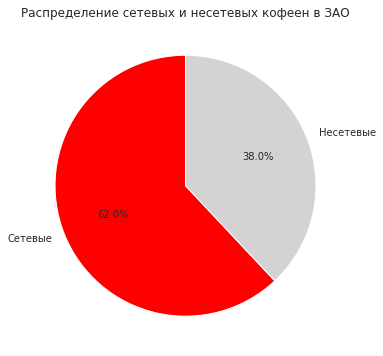

In [129]:
# Вычисляем процент сетевых кофеен в ЗАО
chain_counts = zao_coffee_shops['chain'].value_counts()

# Создаем круговую диаграмму
plt.figure(figsize=(8, 6))
chain_counts.plot(kind='pie', 
                  autopct='%1.1f%%', 
                  startangle=90, 
                  colors=['red', 'lightgray'],  # Красный для сетевых, светло-серый для несетевых
                  labels=['Сетевые', 'Несетевые'])

plt.title('Распределение сетевых и несетевых кофеен в ЗАО')
plt.ylabel('')  # скрыть название оси y
plt.show()


В районе доминируют крупные сетевые игроки, а не маленькие независимые кофейни. Посмотрим на имена конкурентов

In [130]:
zao_coffee_shops['name'].unique()

array(['Кофемания', 'Grao De Cafe', 'Udcкафе', 'Carrots and beans',
       'CofeFest', 'Шоколадница', 'Coffee Moose', 'Cinnabon',
       'One Price Coffee', 'B&d Cafe', 'Wild Bean', 'Cafe', 'ДаблБи',
       'Корица', 'Sova Coffee', 'Trübli-bar', 'Шах&Мат',
       'Kaya Coffee Shop', 'АндерСон', 'Skuratov, coffee roasters',
       'Иди обниму', 'ЭтоКофе', 'Зефир', 'КОФЕПОРТ', 'Manufaktura',
       'Coffee 42', 'Mendia', 'Lori Bar', 'Coffee and the City',
       'Winners', 'Coffee Like', 'Cofix', 'Zeфир', 'Кофе&Moloko',
       'Americano Black Coffee & Food', 'Кофеиново', 'Кофе и', 'Завтраки',
       'Панчо Фэктори', 'Coffee Point', 'Beautyfood cafe',
       'Golden coffee', 'Пирог Хауз', 'Udcкафе Upside Down Cake',
       '9 Bar Coffee', 'Синнабон', 'Ланч Бокс', 'One And Double',
       'Kollektiv', 'Krispy Kreme', 'But First Coffee', 'Кофе & Moloko',
       'Максбейкери', 'Hellopapaya', 'Lav cafe', 'Кофе Хауз',
       'Surf Coffee x Amen', 'Моби Кит', 'Дворик Невского', 'Кофе Град',
  

In [131]:
# Отбираем сетевые кофейни
chain_coffee_shops = zao_coffee_shops[zao_coffee_shops['chain'] == 1]

# Отбираем уникальные сетевые кофейни
unique_chain_coffee_names = sorted(chain_coffee_shops['name'].unique())

# Выводим уникальные названия сетевых кофеен
print(', '.join(unique_chain_coffee_names))

9 Bar Coffee, Americano Black Coffee & Food, Cafe, Cafe inn, Cinnabon, CofeFest, Coffee Like, Coffee Moose, Coffee Music, Coffee Party, Coffee Point, Coffee and the City, Cofix, Crop. coffee & smoothie bar, Grao De Cafe, Kaya Coffee Shop, Krispy Kreme, Levin Bakehouse, Milk&Beans, One Price Coffee, Skuratov, coffee roasters, Sova Coffee, Star Hit Cafe, The wild bean cafe, Udcкафе, Wild Bean, Winners, Zефир, АндерСон, Буханка, Виолино, ДаблБи, Зефир, Иди обниму, КОФЕПОРТ, Кондитерская-кулинария Брусника, Кофе & Moloko, Кофе Хауз, Кофемания, Пирог Хауз, Пончики! Выпекаем на месте, Синнабон, Скалка, Чабан Чуду, Шоколадница


Некоторые действительно достаточно известные: Cinnabon, Krispy Kreme, Кофе Хауз, Кофемания, Шоколадница.

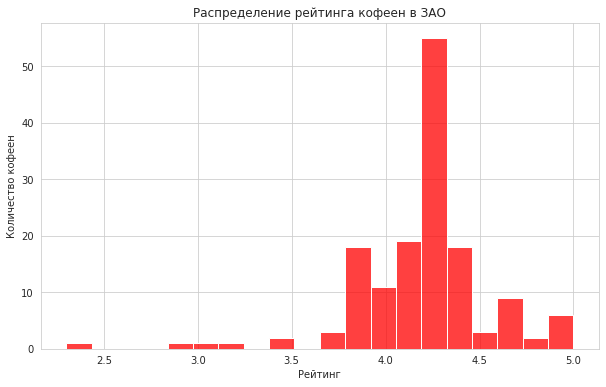

In [132]:
# задаем размер
plt.figure(figsize=(10, 6))

# строим график
sns.histplot(zao_coffee_shops['rating'], bins=20, color="red")

# подписи
plt.title("Распределение рейтинга кофеен в ЗАО")
plt.xlabel("Рейтинг")
plt.ylabel("Количество кофеен")

# отображение
plt.show()


Средний рейтинг 4.25, хотя есть и кофейни с низким рейтнгом, но нам это только наруку.

In [133]:
# Применяем написанную ранее функцию к медианному значению
average_opening_time_minutes = zao_coffee_shops['start_minutes'].median()
formatted_time = minutes_to_time(average_opening_time_minutes)

print(f"Среднее время открытия кофеен в ЗАО: {formatted_time}")

Среднее время открытия кофеен в ЗАО: 8:00


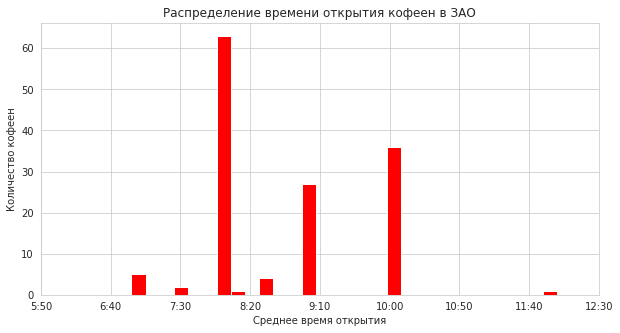

In [134]:
# Построение гистограммы для времени открытия
plt.figure(figsize=(10, 5))
zao_coffee_shops['start_minutes'].hist(color='red', bins=30)

# Преобразование меток на оси x в часы и минуты
x_ticks_in_hours = [minutes_to_time(minute) for minute in plt.xticks()[0]]
plt.xticks(plt.xticks()[0], x_ticks_in_hours)

# подпси
plt.title('Распределение времени открытия кофеен в ЗАО')
plt.xlabel('Среднее время открытия')
plt.ylabel('Количество кофеен')

# отображение
plt.show()


Среднее время открытия 8 утра, но еще два пика на 9 и 10 утра.

In [135]:
# Применяем функцию к медианному значению
average_closing_time_minutes = zao_coffee_shops['end_minutes'].median()
formatted_time = minutes_to_time(average_closing_time_minutes)

print(f"Среднее время открытия кофеен в ЗАО: {formatted_time}")

Среднее время открытия кофеен в ЗАО: 22:00


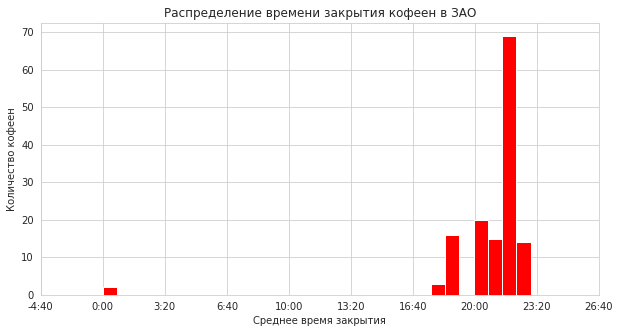

In [136]:
# Построение гистограммы для времени закрытия
plt.figure(figsize=(10, 5))
zao_coffee_shops['end_minutes'].hist(color='red', bins=30)

# Преобразование меток на оси x в часы и минуты с попомщью ранее написанной функции
x_ticks_in_hours = [minutes_to_time(minute) for minute in plt.xticks()[0]]
plt.xticks(plt.xticks()[0], x_ticks_in_hours)

# подпси
plt.title('Распределение времени закрытия кофеен в ЗАО')
plt.xlabel('Среднее время закрытия')
plt.ylabel('Количество кофеен')

# отображение
plt.show()

Среднее время закрытия в 10 вечера, но почти все закрываются в период с 5 до 11 вечера.

In [137]:
price_counts = zao_coffee_shops['price'].value_counts()
print(price_counts)

средние          38
низкие            4
выше среднего     3
высокие           1
Name: price, dtype: int64


In [138]:
# Вычисляем процентное соотношение для каждого уровня цен
price_percentage = (price_counts / price_counts.sum()) * 100

# Создаем DataFrame с количеством и процентами
price_summary = pd.DataFrame({
    'Count': price_counts,
    'Percentage': price_percentage
})

print(price_summary)

               Count  Percentage
средние           38   82.608696
низкие             4    8.695652
выше среднего      3    6.521739
высокие            1    2.173913


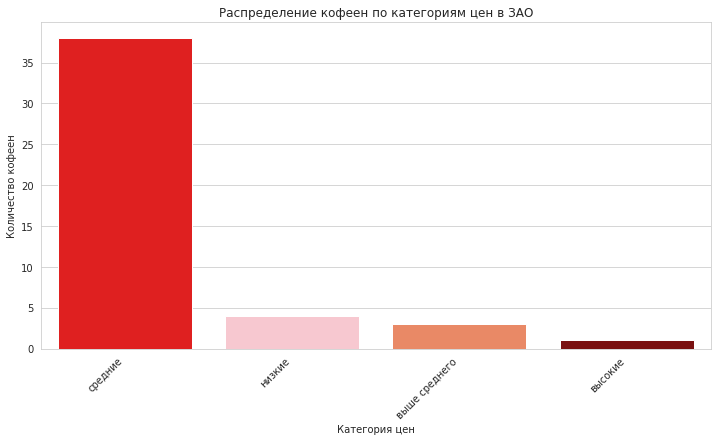

In [140]:
# Устанавливаем размер графика
plt.figure(figsize=(12, 6))

# Построение графика
colors = ['red', 'pink', 'coral', 'darkred']
sns.barplot(x=price_counts.index, y=price_counts.values, palette=colors)

# Добавление заголовка к графику и подписей осей
plt.title('Распределение кофеен по категориям цен в ЗАО')
plt.xlabel('Категория цен')
plt.ylabel('Количество кофеен')
plt.xticks(rotation=45, ha='right')

# Выводим график на экран
plt.show()


82 процента кофеен в ЗАО относится к средней ценовой категории

In [141]:
print('Среднее количество посадочных мест:',zao_coffee_shops['seats'].median())

Среднее количество посадочных мест: 96.0


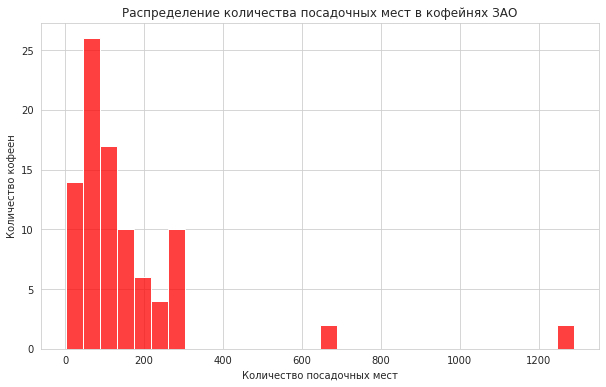

In [142]:
# Визуализация распределения количества посадочных мест
plt.figure(figsize=(10, 6))

# построение графика
sns.histplot(zao_coffee_shops['seats'], bins=30, color="red")

# подписи
plt.title("Распределение количества посадочных мест в кофейнях ЗАО")
plt.xlabel("Количество посадочных мест")
plt.ylabel("Количество кофеен")

# отображение
plt.show()


Много выбросов справа, посмотрим этот же график с ограничением в 350 мест

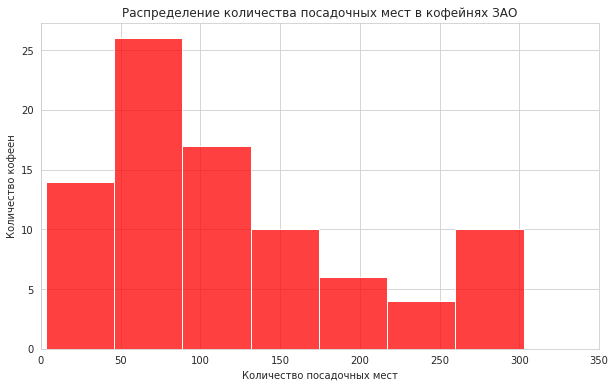

In [143]:
# Визуализация распределения количества посадочных мест


plt.figure(figsize=(10, 6))
sns.histplot(zao_coffee_shops['seats'], bins=30, color="red")
plt.title("Распределение количества посадочных мест в кофейнях ЗАО")
plt.xlabel("Количество посадочных мест")
plt.ylabel("Количество кофеен")
plt.xlim(0, 350)
plt.show()

Диапозон посадочных мест от 0 (на вынос видимо) до 300 мест на заведение. Медана 96 мест.

##### **Подвывод по анализу конкурентов нашей будущей кофейни в ЗАО**

- Средний рейтинг кофеен в ЗАО — 4.27, что может указывать на недостаток высококачественных заведений.

- Доминируют крупные сети: Cinnabon, Krispy Kreme, Кофе Хауз, Кофемания, Шоколадница.

- Большинство кофеен в ЗАО открывается в 8-10 утра и закрывается к 11 вечера.

- 82% заведений имеют среднюю ценовую категорию, что дает простор для создания премиум или бюджетных кофеен.

- Количество мест. Вместимость заведений варьируется от 0 до 300 мест, с медианным значением в 96 мест.

#### Итоговый вывод по анализу рынка

В результате анализа рынка заведений Москвы мы выяснили:

- Самое большое количество заведений категорий кафе, рестораны и кофейни, меньше всего булочных и столовых

- Количество посадочных мест близкое во всех типах заведений и составляет от 30 до 120 мест, за редким исключением до 1200.

- - Сетевой формат. Наиболее распространен среди: булочных (61%), пиццерий (52%) и кофеен (51%). Наименее распространен среди: столовых (28%) и баров/пабов (22%).

- Более 90% популярных заведений не работают круглосуточно.

- Открываются раньше всех булочные и кофенйи, остальные в 9-10 утра, последними открываются бары.

- Раньше всех закрываются столовые в 6 вечера, остальные в 10 вечера, и только пабы и бары могут работать до 2 ночи или до утра.
  
- Центр Москвы содержит 26% всех популярных заведений, остальные районы занимают примерно по 10 процентов от бщего количества заведений

- Рейтинг заведений. В целом обращает на себя внимание маленькая вариабельность рейтингов, разница между максимальным и минимальным рейтингами составляет всего 0.28 балла. Наибольший рейтинг у Центрального административного округа: Заведения в Центральном административном округе имеют самый высокий средний рейтинг, равный 4.37. Распределение рейтинов по категориям также очень близко.

- Срадний чек самый высокий в ЦАО - 1000 уе, в остальных районах ниже, вплоть до 450 уе

- Похоже в маленьких переулках чаще всего располагаются кафе, реже рестораны и кофейни. Булочные и пиццерии на последнем месте.

Анализ непосредственно кофеен показал:
   
- 1413 кофеен в Москве, доминирует по количеству кофеен ЦАО (30%).
- Рейтинг кофеен варьируется от 4.2 до 4.3, с ЗАО имеющим чуть ниже средний рейтинг.
- Судя по картам в ЗАО в припарковой зоне, а также вблизи туристических мест наблюдаются участки вакантные для открытия кофейни.
- Только 4% кофеен работают 24/7.
- Стоимость за чашку в среднем от 75 до 325 уе.

Поскольку ЗАО обладает рядом приемуеств по сравнению с остальными районами для открытия кофени, я бы предложила инвесторам открывать кофеню именно там. Анализ кофеен непосредственно в этом районе показал:

- Лидирующие сети это сетевые (Cinnabon, Krispy Kreme, Кофе Хауз, Кофемания, Шоколадница).
- В большинстве открываются около 8 утра и закрываются около 10 вечера.
- 82% кофеен относятся к средней категории, предоставляя возможность для различного позиционирования на рынке.
- Имеют количество посадочных мест в диапозоне от 0 до 300 мест, в среднем около 96 мест.

На основе этих данных можно принимать обоснованные решения при планировании открытия нового заведения общественного питания.

##### Ссылка на презенитацию


[Презентация на яндекс диске](https://disk.yandex.ru/i/-xfFdP0KfTotEw)

☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕☕